#  Домашнее задание к занятию "Тематическое моделирование"

### Классификация по тональности
В этом домашнем задании вам предстоит классифицировать по тональности отзывы на банки с сайта banki.ru.

Данные содержат непосредственно тексты отзывов, некоторую дополнительную информацию, а также оценку по шкале от 1 до 5.

Тексты хранятся в json-ах в массиве responses.

Посмотрим на примере отзыва: возьмите для удобства ноутбук, размещенный в папке репозитория.

### Часть 1. Анализ текстов
1. Посчитайте количество отзывов в разных городах и на разные банки
1. Постройте гистограмы длин слов в символах и в словах
1. Найдите 10 самых частых:
- слов
- слов без стоп-слов
- лемм
- существительных
4. Постройте кривые Ципфа и Хипса
5. Ответьте на следующие вопросы:
- какое слово встречается чаще, "сотрудник" или "клиент"?
- сколько раз встречается слова "мошенничество" и "доверие"?
6. В поле "rating_grade" записана оценка отзыва по шкале от 1 до 5. Используйте меру $tf-idf$, для того, чтобы найти ключевые слова и биграмы для положительных отзывов (с оценкой 5) и отрицательных отзывов (с оценкой 1)

### Часть 2. Тематическое моделирование
1. Постройте несколько тематических моделей коллекции документов с разным числом тем. Приведите примеры понятных (интерпретируемых) тем.
2. Найдите темы, в которых упомянуты конкретные банки (Сбербанк, ВТБ, другой банк). Можете ли вы их прокомментировать / объяснить? Эта часть задания может быть сделана с использованием gensim.

### Часть 3. Классификация текстов
- Сформулируем для простоты задачу бинарной классификации: будем классифицировать на два класса, то есть, различать резко отрицательные отзывы (с оценкой 1) и положительные отзывы (с оценкой 5).

1. Составьте обучающее и тестовое множество: выберите из всего набора данных N1 отзывов с оценкой 1 и N2 отзывов с оценкой 5 (значение N1 и N2 – на ваше усмотрение). Используйте sklearn.model_selection.train_test_split для разделения множества отобранных документов на обучающее и тестовое.
1. Используйте любой известный вам алгоритм классификации текстов для решения задачи и получите baseline. Сравните разные варианты векторизации текста: использование только униграм, пар или троек слов или с использованием символьных $n$-грам.
1. Сравните, как изменяется качество решения задачи при использовании скрытых тем в качестве признаков:
- 1-ый вариант: $tf-idf$ преобразование (sklearn.feature_extraction.text.TfidfTransformer) и сингулярное разложение (оно же – латентый семантический анализ) (sklearn.decomposition.TruncatedSVD),
- 2-ой вариант: тематические модели LDA (sklearn.decomposition.LatentDirichletAllocation). Используйте accuracy и F-measure для оценки качества классификации.

В ноутбуке, размещенном в папке репозитория. написан примерный Pipeline для классификации текстов.

Эта часть задания может быть сделана с использованием sklearn.

## Импорт библиотек

In [2]:
import json

import bz2
import regex 
from tqdm import tqdm
from scipy import sparse

import pprint

In [3]:
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## Данные

In [4]:
responses = []
with bz2.BZ2File('banki_responses.json.bz2', 'r') as thefile:
    for row in tqdm(thefile):
        resp = json.loads(row)
        if not resp['rating_not_checked'] and (len(resp['text'].split()) > 0):
            responses.append(resp)

201030it [02:20, 1426.57it/s]



Посмотрим на пример отзыва:

In [5]:
responses[99]

{'city': 'г. Саратов',
 'rating_not_checked': False,
 'title': 'Карта ко вкладу',
 'num_comments': 0,
 'bank_license': 'лицензия № 880',
 'author': 'ronnichka',
 'bank_name': 'Югра',
 'datetime': '2015-06-03 20:56:57',
 'text': 'Здравствуйте! Хотела написать, что мне месяц не выдают карту ко вкладу, ссылаясь на "нам же их из Самары везут" (на секундочку 5 часов езды от нашего города). Но! Прочитала, что людям 3,5 месяцев не выдают карту, и поняла, что у меня все хорошо, пока что. И подарок мне дали, и кулер в отделении есть. Так что я, конечно, готова ждать. Правда хотелось бы не очень долго.',
 'rating_grade': 3}

In [24]:
len(responses)

153499

### Решение

### Часть 1. Анализ текстов
1. Посчитайте количество отзывов в разных городах и на разные банки
2. Постройте гистограмы длин слов в символах и в словах
3. Найдите 10 самых частых:
- слов
- слов без стоп-слов
- лемм
- существительных

4. Постройте кривые Ципфа и Хипса
5. Ответьте на следующие вопросы:
- какое слово встречается чаще, "сотрудник" или "клиент"?
- сколько раз встречается слова "мошенничество" и "доверие"?

6. В поле "rating_grade" записана оценка отзыва по шкале от 1 до 5. Используйте меру $tf-idf$, для того, чтобы найти ключевые слова и биграмы для положительных отзывов (с оценкой 5) и отрицательных отзывов (с оценкой 1)


Поместим данные в датафрейм при помощи pandas, а далее можно уже будет работать с таблицей

In [6]:
data_responses = pd.DataFrame(responses[:50000])
data_responses

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
0,г. Москва,False,Жалоба,0,лицензия № 2562,uhnov1,Бинбанк,2015-06-08 12:50:54,Добрый день! Я не являюсь клиентом банка и пор...,NaN
1,г. Новосибирск,False,Не могу пользоваться услугой Сбербанк он-лайн,0,лицензия № 1481,Foryou,Сбербанк России,2015-06-08 11:09:57,Доброго дня! Являюсь держателем зарплатной кар...,NaN
2,г. Москва,False,Двойное списание за один товар.,1,лицензия № 2562,Vladimir84,Бинбанк,2015-06-05 20:14:28,Здравствуйте! Дублирую свое заявление от 03.0...,NaN
3,г. Ставрополь,False,Меняют проценты комиссии не предупредив и не ...,2,лицензия № 1481,643609,Сбербанк России,2015-06-05 13:51:01,Добрый день!! Я открыл расчетный счет в СберБа...,NaN
4,г. Челябинск,False,Верните денежные средства за страховку,1,лицензия № 2766,anfisa-2003,ОТП Банк,2015-06-05 10:58:12,"04.03.2015 г. взяла кредит в вашем банке, заяв...",NaN
...,...,...,...,...,...,...,...,...,...,...
49995,г. Москва,False,Отвратительная работа техподдержки Филиала ОАО...,0,лицензия № 1481,OOO MEGUMI,Сбербанк России,2014-04-23 14:52:00,Между ООО МЕГУМИ и ОАО Сбербанк России заключе...,1.0
49996,г. Москва,False,"""Хорошие"" сотрудники",0,лицензия № 2268,MBR2007,МТС Банк,2014-04-22 20:54:00,Добрый день! Была у меня в этом славном банке ...,1.0
49997,г. Москва,False,"Не работает Интернет-банк, сайт недоступен",3,лицензия № 3251,stepanovdv,Промсвязьбанк,2014-04-21 14:52:00,"Не работает Интернет-банк, сайт недоступен. В ...",3.0
49998,г. Москва,False,Отобрали деньги на неопределённый срок,0,лицензия № 1961,alexym,Связной Банк,2014-04-23 15:13:00,Резюме: 1. Отобрали деньги на неопределённый с...,2.0


In [27]:
data_responses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   city                50000 non-null  object 
 1   rating_not_checked  50000 non-null  bool   
 2   title               50000 non-null  object 
 3   num_comments        50000 non-null  int64  
 4   bank_license        49999 non-null  object 
 5   author              50000 non-null  object 
 6   bank_name           50000 non-null  object 
 7   datetime            50000 non-null  object 
 8   text                50000 non-null  object 
 9   rating_grade        22578 non-null  float64
dtypes: bool(1), float64(1), int64(1), object(7)
memory usage: 3.5+ MB


In [28]:
quantity_banks = data_responses.groupby(by = 'city').count().sort_values(by='text', ascending=False )['text']
quantity_banks

city
г. Москва                     20764
г. Санкт-Петербург             5339
г. Екатеринбург                 900
г. Новосибирск                  832
г. Нижний Новгород              785
                              ...  
г. Лондон (Москва)                1
г. Локоть                         1
г. Лобня (Московская обл.)        1
г. Лобня (Москва)                 1
г. ярославль                      1
Name: text, Length: 1956, dtype: int64

In [29]:
quantity_banks = data_responses.groupby(by = 'bank_name').count().sort_values(by='text', ascending=False )['text']
quantity_banks

bank_name
Сбербанк России                     7880
Альфа-Банк                          3388
Хоум Кредит Банк                    2861
Русский Стандарт                    2466
ВТБ 24                              2461
                                    ... 
Капиталбанк                            1
Консервативный Коммерческий Банк       1
Кошелев-Банк                           1
Кредит Экспресс                        1
Далена                                 1
Name: text, Length: 408, dtype: int64

#### 1 Посчитайте количество отзывов в разных городах и на разные банки

In [30]:
data_responses_2 = data_responses

In [31]:
# количество нулевых = неизвестных значений городов
data_responses_2[data_responses_2.city.isnull()].head()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade


In [32]:
# замена строк на Неизвестный город и без рейтинга на ноль
for row in range(0, len(data_responses_2)):
    if data_responses_2.city[row] == None: 
        data_responses_2.city[row] = 'Неизвестный'
    elif data_responses_2['rating_grade'].isnull()[row]: 
        data_responses_2['rating_grade'][row] = 0
    else:
        continue

<ipython-input-32-c37f173ccc42>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_responses_2['rating_grade'][row] = 0


In [33]:
data_responses_2.head()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
0,г. Москва,False,Жалоба,0,лицензия № 2562,uhnov1,Бинбанк,2015-06-08 12:50:54,Добрый день! Я не являюсь клиентом банка и пор...,0.0
1,г. Новосибирск,False,Не могу пользоваться услугой Сбербанк он-лайн,0,лицензия № 1481,Foryou,Сбербанк России,2015-06-08 11:09:57,Доброго дня! Являюсь держателем зарплатной кар...,0.0
2,г. Москва,False,Двойное списание за один товар.,1,лицензия № 2562,Vladimir84,Бинбанк,2015-06-05 20:14:28,Здравствуйте! Дублирую свое заявление от 03.0...,0.0
3,г. Ставрополь,False,Меняют проценты комиссии не предупредив и не ...,2,лицензия № 1481,643609,Сбербанк России,2015-06-05 13:51:01,Добрый день!! Я открыл расчетный счет в СберБа...,0.0
4,г. Челябинск,False,Верните денежные средства за страховку,1,лицензия № 2766,anfisa-2003,ОТП Банк,2015-06-05 10:58:12,"04.03.2015 г. взяла кредит в вашем банке, заяв...",0.0


In [7]:
from nltk.tokenize import word_tokenize

In [8]:
from string import punctuation
punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [9]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to C:\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [10]:
from collections import Counter

In [38]:
corpus = [token for respon in data_responses_2.city for token in word_tokenize(respon) if token not in punctuation]
print(len(corpus))
corpus[:10]

104138


['г.',
 'Москва',
 'г.',
 'Новосибирск',
 'г.',
 'Москва',
 'г.',
 'Ставрополь',
 'г.',
 'Челябинск']

In [39]:
freq_dict = Counter(corpus)

freq_dict_sorted= sorted(freq_dict.items(), key=lambda x: -x[1])
# freq_dict.most_common(20)

In [40]:
freq_dict_sorted[:10]

[('г.', 49999),
 ('Москва', 21222),
 ('Санкт-Петербург', 5440),
 ('Новгород', 926),
 ('Екатеринбург', 913),
 ('Нижний', 903),
 ('Новосибирск', 859),
 ('Ростов-на-Дону', 787),
 ('Самара', 685),
 ('Казань', 596)]

In [41]:
freq_dict_sorted[2]

('Санкт-Петербург', 5440)

#### Второй более простой способ расчёта отзывов по городам и по банкам

In [42]:
data_responses.city.value_counts()

г. Москва                           20764
г. Санкт-Петербург                   5339
г. Екатеринбург                       900
г. Новосибирск                        832
г. Нижний Новгород                    785
                                    ...  
г. зеленоград (Москва и область)        1
г. Рязань (Нижний Новгород)             1
г. Сысерть                              1
г. Агаповка                             1
г. Гурьевск                             1
Name: city, Length: 1956, dtype: int64

In [43]:
data_responses.bank_name.value_counts()

Сбербанк России     7880
Альфа-Банк          3388
Хоум Кредит Банк    2861
Русский Стандарт    2466
ВТБ 24              2461
                    ... 
Эсидбанк               1
Курган                 1
Платина                1
Кредит Экспресс        1
Век                    1
Name: bank_name, Length: 408, dtype: int64

#### 2 Постройте гистограмы длин слов в символах и в словах

In [44]:
data_responses_3 = data_responses_2

In [45]:
data_responses_3.head()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
0,г. Москва,False,Жалоба,0,лицензия № 2562,uhnov1,Бинбанк,2015-06-08 12:50:54,Добрый день! Я не являюсь клиентом банка и пор...,0.0
1,г. Новосибирск,False,Не могу пользоваться услугой Сбербанк он-лайн,0,лицензия № 1481,Foryou,Сбербанк России,2015-06-08 11:09:57,Доброго дня! Являюсь держателем зарплатной кар...,0.0
2,г. Москва,False,Двойное списание за один товар.,1,лицензия № 2562,Vladimir84,Бинбанк,2015-06-05 20:14:28,Здравствуйте! Дублирую свое заявление от 03.0...,0.0
3,г. Ставрополь,False,Меняют проценты комиссии не предупредив и не ...,2,лицензия № 1481,643609,Сбербанк России,2015-06-05 13:51:01,Добрый день!! Я открыл расчетный счет в СберБа...,0.0
4,г. Челябинск,False,Верните денежные средства за страховку,1,лицензия № 2766,anfisa-2003,ОТП Банк,2015-06-05 10:58:12,"04.03.2015 г. взяла кредит в вашем банке, заяв...",0.0


In [47]:
data_responses_3['len_chars'] = 0
data_responses_3['len_words'] = 0
for i, each_response in enumerate(data_responses_3.text):
  data_responses_3['len_chars'][i] = len(each_response)
  data_responses_3['len_words'][i] = len(word_tokenize(each_response))

<ipython-input-47-d983ee4eefb6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_responses_3['len_chars'][i] = len(each_response)
<ipython-input-47-d983ee4eefb6>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_responses_3['len_words'][i] = len(word_tokenize(each_response))


In [48]:
data_responses_3[['city', 'text', 'len_chars', 'len_words']].sort_values(by='len_words')

,city,text,len_chars,len_words
796,г. Москва,"Банковские карты, пожалуйста, сделайте!!!",41,9
2287,г. Москва,"В конце-то концов, когда заработает SMS оповещ...",52,10
5081,г. Москва,"Мобильный банк не работает, сотрудникам кулл-ц...",75,12
47647,г. Владивосток,"Достали своими звонками и неким М-ским, которо...",82,15
39425,г. Санкт-Петербург,"Карта была заказана 24.06.2014, т.е. более мес...",90,17
...,...,...,...,...
31703,г. Санкт-Петербург,Являюсь клиентом банка всего несколько месяцев...,21075,3924
29058,г. Москва,"Представьте себе такую ситуацию: Вы, ежедневн...",24992,4248
26023,г. Москва,Как и обещал в своем предыдущем отзыве от 29 о...,27364,4582
38104,г. Москва,Введение оно же вывод. Данный отзыв содержит к...,27220,5043


#### 3 Найдите 10 самых частых:
- слов
- слов без стоп-слов
- лемм
- существительных

Ради интереса выявим самые частоиспользуемые символы

In [49]:
chars = [each_char for each_response in data_responses_3.text for each_char in each_response.strip().lower()]

In [50]:
chars[:5]

['д', 'о', 'б', 'р', 'ы']

In [51]:
freq_chars = nltk.FreqDist(chars)

In [52]:
freq_chars.most_common()[:10]

[(' ', 10953414),
 ('о', 6075421),
 ('е', 4904355),
 ('а', 4811981),
 ('н', 4099739),
 ('и', 3871426),
 ('т', 3811474),
 ('с', 2854006),
 ('р', 2656942),
 ('в', 2398410)]

#### Самые частовстречающиеся слова топ-10

In [53]:
words = []
for each_response in data_responses_3.text:
  words.append(each_response.lower())
words_str = ''.join(words)

In [54]:
words_token = word_tokenize(words_str) 

In [55]:
words_token[:5]

['добрый', 'день', '!', 'я', 'не']

In [56]:
freq_word = nltk.FreqDist(words_token)

In [57]:
freq_word.most_common()[:10]

[(',', 957075),
 ('.', 592412),
 ('в', 392964),
 ('и', 315085),
 ('не', 258968),
 ('на', 213148),
 ('что', 185068),
 ('я', 171923),
 ('с', 140896),
 ('по', 113999)]

#### Самые частовстречающиеся слов без стоп-слов топ-10

In [11]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
from nltk.corpus import stopwords
print(stopwords.words('russian'))

['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас', 'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 'эту', 'моя', 'впр

In [13]:
punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [14]:
noise = stopwords.words('russian') + list(punctuation)

In [65]:
len(words_token)

13033720

Так как данных довольно много и тяжело их обрабатывать, было принято решение, сделать подвыборку 500 000

In [ ]:
from tqdm import tqdm
words_token_no_stopwords = words_token[:500000]

In [71]:
for i, elem in tqdm(enumerate(words_token_no_stopwords)):
  if elem in noise:
    words_token_no_stopwords.pop(i)

342077it [00:33, 10075.17it/s] 


In [72]:
len(words_token_no_stopwords)

342076

In [73]:
words_token_no_stopwords_2 = words_token_no_stopwords[:500000]

In [74]:
for i, elem in tqdm(enumerate(words_token_no_stopwords_2)):
  if elem in noise:
    words_token_no_stopwords_2.pop(i)

303376it [00:06, 47142.27it/s] 


Уберём знаки пунктуации, которые являются повторением тех, которые есть в punctuation, но не удалились

In [77]:
while "..." in tqdm(words_token_no_stopwords_2): 
  words_token_no_stopwords_2.remove("...")
while  "''" in words_token_no_stopwords_2: 
  words_token_no_stopwords_2.remove("''")
while "``" in words_token_no_stopwords_2: 
  words_token_no_stopwords_2.remove("``")
while "``" in words_token_no_stopwords_2: 
  words_token_no_stopwords_2.remove(",")
else:
    print('закончили')

100%|█████████████████████████████████████████████████████████████████████| 297309/297309 [00:00<00:00, 2678331.42it/s]

закончили


In [78]:
words_token_no_stopwords_2[:10]

['добрый',
 'день',
 'являюсь',
 'клиентом',
 'банка',
 'поручителем',
 'кредитному',
 'договору',
 'также',
 'являюсь']

In [79]:
freq_word_nostop = nltk.FreqDist(words_token_no_stopwords_2)

In [80]:
freq_word_nostop.most_common()[:10]

[('банка', 3630),
 ('банк', 2752),
 ('это', 2154),
 ('деньги', 1448),
 ('карты', 1356),
 ('карту', 1263),
 ('кредит', 998),
 ('день', 991),
 ('года', 850),
 ('заявление', 839)]

Самые частовстречающиеся лемм топ-10


In [81]:
len(words_token_no_stopwords_2)

297309

In [82]:
words_token_lemma = words_token_no_stopwords_2

In [83]:
len(words_token_lemma)

297309

In [15]:
from pymorphy2 import MorphAnalyzer
pymorphy2_analyzer = MorphAnalyzer()

In [85]:
for i, word in enumerate(words_token_lemma):
  words_token_lemma[i] = pymorphy2_analyzer.parse(word)[0].normal_form

In [86]:
# проверка работы pymorphy
# pymorphy2_analyzer.parse('лошади')[0].normal_form

In [87]:
words_token_lemma[:10]

['добрый',
 'день',
 'являться',
 'клиент',
 'банк',
 'поручитель',
 'кредитный',
 'договор',
 'также',
 'являться']

In [88]:
len(words_token_lemma)

297309

In [89]:
freq_word_lemma = nltk.FreqDist(words_token_lemma)

In [90]:
freq_word_lemma.most_common()[:10]

[('банк', 8466),
 ('карта', 4226),
 ('это', 2433),
 ('мой', 2361),
 ('день', 2125),
 ('кредит', 2125),
 ('деньга', 1976),
 ('который', 1948),
 ('сотрудник', 1847),
 ('клиент', 1666)]

Самые частовстречающиеся существительных топ-10

In [55]:
# принцип алгоритма по отбору существительных
# p = pymorphy2_analyzer.parse('идти')
# p

[Parse(word='идти', tag=OpencorporaTag('INFN,impf,intr'), normal_form='идти', score=1.0, methods_stack=((DictionaryAnalyzer(), 'идти', 1696, 0),))]

In [68]:
# p[0].tag

OpencorporaTag('INFN,impf,intr')

In [71]:
# p[0].score

1.0

In [70]:
# 'NOUN' in p[0].tag

False

In [91]:
nouns = words_token_lemma

In [92]:
# проходим по словам-леммам, которые мы подготовили на прошлом шаге
#  далее пропускаем их через pymorphy2_analyzer, и проверяем часть речи, если tag NOUN и при этом оценка более 50 %, 
# то можно причислять это слово к существительному и записывать в список, а потом расчитаем частоту данных слов при помощи FreqDist

for i, word in enumerate(nouns):
    p = pymorphy2_analyzer.parse(word)[0]
    if ('NOUN' in p.tag) and (p.score > 0.5):
        continue
    else:
        nouns.pop(i)

In [93]:
freq_nouns = nltk.FreqDist(nouns)

In [94]:
freq_nouns.most_common()[:10]

[('банк', 8466),
 ('карта', 4226),
 ('день', 2125),
 ('кредит', 2125),
 ('деньга', 1976),
 ('сотрудник', 1847),
 ('клиент', 1666),
 ('счёт', 1665),
 ('год', 1522),
 ('отделение', 1454)]

#### 4 Постройте кривые Ципфа и Хипса

##### Закон Ципфа
Эмпирическая закономерность: если все слова корпуса текста упорядочить по убыванию частоты их использования, то частота n-го слова в таком списке окажется приблизительно обратно пропорциональной его порядковому номеру n. Иными словами, частотность слов убывает очень быстро.


В любом достаточно большом тексте ранг слова обратно пропорционален его частоте: $f = \frac{a}{r}$

$f$ – частота слова, $r$  – ранг слова, $a$  – параметр, для славянских языков – около 0.07

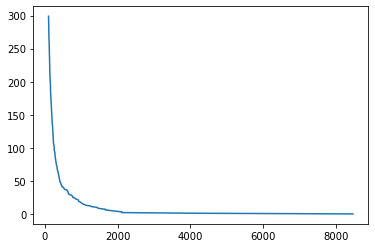

In [95]:
freqs = list(freq_nouns.values())
freqs = sorted(freqs, reverse = True)

fig, ax = plt.subplots()
ax.plot(freqs[:300], range(300))
plt.show()

###### Закон Хипса

С увеличением длины текста (количества токенов), количество слов увеличивается в соответствии с законом: $|V| = K*N^b$


$N$  –  число токенов, $|V|$  – количество слов в словаре, $K, b$  –  параметры, обычно $K \in [10,100], b \in [0.4, 0.6]$


Закон Хипса -- обратная сторона закона Ципфа. Он описывает, что чем больше корпус, тем меньше новых слов добавляется с добавлением новых текстов. В какой-то момент корпус насыщается.

In [96]:
data_responses_4 = data_responses_3[:5000]

In [97]:
from tqdm import tqdm

cnt = Counter()
n_words = []
n_tokens = []
tokens = []

for index, row in tqdm(data_responses_4.iterrows(), total = len(data_responses_4)):
    tokens = word_tokenize(row['text'])
    cnt.update([token for token in tokens if token not in punctuation])
    n_words.append(len(cnt))
    n_tokens.append(sum(cnt.values()))

100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:14<00:00, 350.61it/s]


In [99]:
fig, ax = plt.subplots()
ax.plot(n_tokens, n_words)
plt.show()

#### 5 Ответьте на следующие вопросы:
- какое слово встречается чаще, "сотрудник" или "клиент"?
- сколько раз встречается слова "мошенничество" и "доверие"?

In [108]:
bow_nouns = freq_nouns.most_common()

In [109]:
word_1 = "сотрудник"
word_2 = "клиент"
for i in bow_nouns:
    if word_1 in i:
        quantity_1 = i[1]
    elif word_2 in i:
        quantity_2 = i[1]
        
if quantity_1 > quantity_2:
    print('сотрудник встречается чаще')
elif quantity_1 < quantity_2:
        print('клиент встречается чаще')
    

сотрудник встречается чаще


In [110]:
word_1 = "мошенничество"
word_2 = "доверие"
for i in bow_nouns:
    if word_1 in i:
        quantity_1 = i[1]
    elif word_2 in i:
        quantity_2 = i[1]
        
print(f'мошенничество встречается {quantity_1} раз')
print(f'доверие встречается {quantity_2} раз')

мошенничество встречается 51 раз
доверие встречается 39 раз


#### 6 В поле "rating_grade" записана оценка отзыва по шкале от 1 до 5. Используйте меру  𝑡𝑓−𝑖𝑑𝑓 , для того, чтобы найти ключевые слова и биграмы для положительных отзывов (с оценкой 5) и отрицательных отзывов (с оценкой 1)

`TfidfVectorizer` делает то же, что и `CountVectorizer`, но в качестве значений – tf-idf каждого слова.

Как считается tf-idf:

TF (term frequency) – относительная частотность слова в документе:
$$ TF(t,d) = \frac{n_t}{\sum_k n_k} $$

`t` -- слово (term), `d` -- документ, $n_t$ -- количество вхождений слова, $n_k$ -- количество вхождений остальных слов

IDF (inverse document frequency) – обратная частота документов, в которых есть это слово:
$$ IDF(t, D) = \mbox{log} \frac{|D|}{|{d : t \in d}|} $$

`t` -- слово (term), `D` -- коллекция документов

Перемножаем их:
$$TFIDF_(t,d,D) = TF(t,d) \times IDF(i, D)$$

Сакральный смысл – если слово часто встречается в одном документе, но в целом по корпусу встречается в небольшом 
количестве документов, у него высокий TF-IDF.

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [11]:
data_1_5 = data_responses[(data_responses.rating_grade == 1.) | (data_responses.rating_grade == 5.)][['text','rating_grade']]

In [12]:
X_train, X_test, y_train, y_test = train_test_split(data_1_5['text'], data_1_5['rating_grade'], 
                                                    test_size=0.33, random_state=42)

In [13]:
vec = TfidfVectorizer(ngram_range = (1, 2))
bow = vec.fit_transform(X_train)

In [14]:
clf = LogisticRegression(random_state=42, solver='liblinear')
clf.fit(bow, y_train)
pred = clf.predict(vec.transform(X_test))
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         1.0       1.00      0.92      0.96      4861
         5.0       0.55      0.99      0.71       463

    accuracy                           0.93      5324
   macro avg       0.78      0.96      0.83      5324
weighted avg       0.96      0.93      0.94      5324



### Часть 2. Тематическое моделирование
1. Постройте несколько тематических моделей коллекции документов с разным числом тем. Приведите примеры понятных (интерпретируемых) тем.
2. Найдите темы, в которых упомянуты конкретные банки (Сбербанк, ВТБ, другой банк). Можете ли вы их прокомментировать / объяснить?
Эта часть задания может быть сделана с использованием gensim.


In [15]:
data_responses.sort_values(by='title', inplace = True)
data_responses.head()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
35670,г. Москва,False,,3,лицензия № 1971,Demon5,Ханты-Мансийский банк Открытие,2014-08-29 15:55:00,По моему заявлению в банк была выпущена дебето...,2.0
7269,г. Санкт-Петербург,False,,43,лицензия № 3354,nw1234,Ренессанс Кредит,2015-04-03 21:43:00,"Как известно – первое апреля день дурака, врем...",NaN
25002,г. Краснодар,False,,3,лицензия № 1326,minust2001,Альфа-Банк,2014-11-30 13:44:00,В свое время по совету своего родственника зав...,2.0
32043,г. Москва,False,,23,лицензия № 2673,boris,Тинькофф Банк,2014-10-04 14:27:00,Лето с банком Тинькофф выдалось жарким. На мой...,1.0
8241,г. Москва,False,,22,лицензия № 1971,Replay,Ханты-Мансийский банк Открытие,2015-03-30 12:48:00,Вступление. На банки.ру я не логинился давно. ...,1.0


#### Список тем для отзывов

In [219]:
data_responses.title.value_counts()

Звонки из банка                                                      153
                                                                     147
Претензия                                                            137
Благодарность                                                        116
Телефонный терроризм                                                  96
                                                                    ... 
Хуже ко мне еще нигде не относились! Потребовалась помощь медиков      1
Развивать и развивать дистанционное направление                        1
Дезинформация, отсутствие компетенции и навязывание страхования        1
Обслуживание г. Барнаул                                                1
Банк не возвращает деньги, ошибочно взысканные                         1
Name: title, Length: 41802, dtype: int64

In [239]:
len(data_responses.title.value_counts())

41802

In [220]:
len(data_responses)

50000

## Генсим

### TfidfModel

In [18]:
from gensim.corpora import Dictionary
from gensim.models import TfidfModel
from gensim import similarities

In [19]:
data_responses_mini = data_responses[:7500]

In [20]:
texts = [text.split() for text in data_responses_mini.text]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

Косинусная близость:


$$similarity=\cos(\theta )={\mathbf {A} \cdot \mathbf {B}  \over \|\mathbf {A} \|\|\mathbf {B} \|}={\frac {\sum \limits _{i=1}^{n}{A_{i}B_{i}}}{{\sqrt {\sum \limits _{i=1}^{n}{A_{i}^{2}}}}{\sqrt {\sum \limits _{i=1}^{n}{B_{i}^{2}}}}}}$$

Вычисление сходства по косинусной мере на векторах $tf-idf$:

In [21]:
tfidf = TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]

In [22]:
corpus_tfidf

In [23]:
# %%time
index = similarities.MatrixSimilarity(corpus_tfidf)
sims = index[corpus_tfidf]

In [24]:
len(corpus)

7500

In [25]:
sims[0]

array([1.        , 0.00210143, 0.01055713, ..., 0.01413624, 0.00127125,
       0.03775702], dtype=float32)

In [26]:
sims.shape

(7500, 7500)

In [27]:
import seaborn as sns

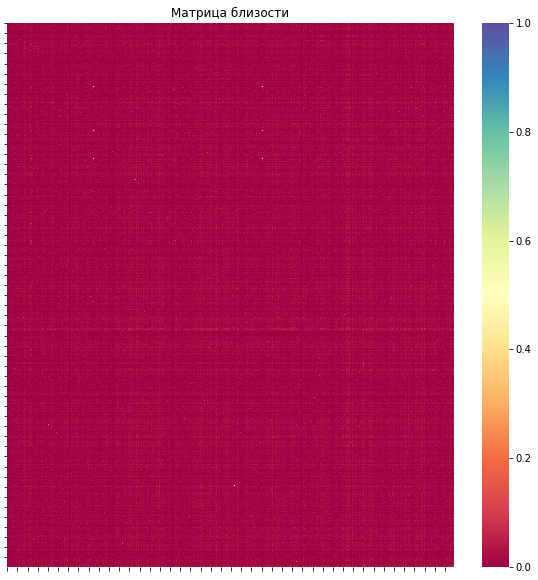

In [28]:
plt.figure(figsize = (10,10))
sns.heatmap(data=sims, cmap = 'Spectral').set(xticklabels=[],yticklabels=[])
plt.title("Матрица близости")
plt.show()

### Латентно-семантический анализ (LSA, LSI)


Сингулярное разложение: $M'_k = U \Sigma_k V^t_k$

* $M$ – матрица слово-документ
* $U$ – матрица документ-тема
* $k$ – число тем
* $V$ - матрица слово-тема

In [22]:
from gensim.models import lsimodel

In [30]:
%%time
lsi = lsimodel.LsiModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=30)

Wall time: 10.5 s


In [31]:
lsi.show_topics(5)

[(0,
  '0.122*"я" + 0.119*"-" + 0.118*"мне" + 0.092*"меня" + 0.089*"что" + 0.087*"Я" + 0.087*"о" + 0.084*"деньги" + 0.083*"у" + 0.083*"банка"'),
 (1,
  '0.271*"звонки" + 0.238*"номер" + 0.191*"персональных" + 0.187*"поступают" + 0.183*"телефона" + 0.179*"удалить" + 0.170*"базы" + 0.167*"обработку" + 0.167*"мой" + 0.154*"данных"'),
 (2,
  '0.165*"денежных" + 0.153*"средств" + 0.146*"средства" + 0.145*"денежные" + 0.134*"г." + 0.111*"2015" + 0.104*"заявление" + 0.103*"№" + 0.095*"размере" + -0.094*"-"'),
 (3,
  '0.147*"кредит" + -0.147*"обязательствам," + -0.147*"деньги" + -0.142*"Копия" + -0.140*"карту" + -0.135*"карты" + -0.135*"направлена" + -0.126*"г.р." + -0.122*"требую" + 0.119*"кредита"'),
 (4,
  '0.179*"вклад" + 0.179*"вклада" + -0.153*"номер" + -0.117*"карты" + -0.112*"банкомат" + -0.111*"карту" + 0.107*"договора" + -0.104*"деньги" + 0.099*"договор" + 0.097*"-"')]

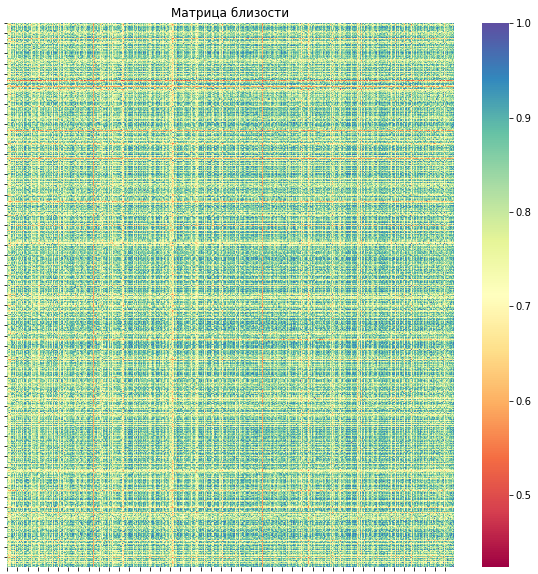

In [32]:
corpus_lsi = lsi[corpus]
index = similarities.MatrixSimilarity(lsi[corpus])
sims = index[corpus_lsi]
sims  = (sims + 1)/2.
plt.figure(figsize = (10,10))
sns.heatmap(data=sims, cmap = 'Spectral').set(xticklabels=[], yticklabels=[])
plt.title("Матрица близости")
plt.show()

### Главные компоненты

In [33]:
X = [0] * len(data_responses_mini)
Y = [0] * len(data_responses_mini)
for i in range(len(data_responses_mini)):
    vec = corpus[i]
    LSI_topics = (lsi[vec])
    for topic in LSI_topics:
        if topic[0] == 0:
            X[i] = topic[1]
        elif topic[0] == 1:
            Y[i] = topic[1]

vis_df = pd.DataFrame({'X': X, 'Y': Y, 'topic' : data_responses_mini.title})

C:\Users\first\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


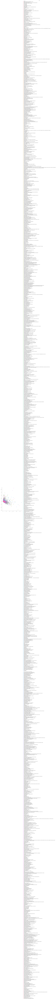

In [39]:
sns.FacetGrid(vis_df[:2000], hue="topic", size = 10).map(plt.scatter, "X", "Y").add_legend()

### Truncated SVD и TSNE

#### t-SNE
t-SNE (t-distributed Stochastic Neighbor Embedding) — техника нелинейного снижения размерности и визуализации многомерных переменных. Она разработана специально для данных высокой размерности Л. ван дер Маатеном и Д. Хинтоном. t-SNE — это итеративный алгоритм, основанный на вычислении попарных расстояний между всеми объектами (в том числе поэтому он довольно медленный).

![TSNE](TSNE.jpg)

In [40]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [41]:
vectors = TfidfVectorizer().fit_transform(data_responses_mini.text) # строим тф-идф матрицу документ-слово
X_reduced = TruncatedSVD(n_components=5, random_state=0).fit_transform(vectors) # оставляем n главных компонент

In [42]:
X_reduced

array([[ 0.21073119,  0.14507518,  0.0848038 ,  0.05170361,  0.00414969],
       [ 0.12225179, -0.01604739,  0.00596343, -0.03143456, -0.02394286],
       [ 0.14472363, -0.02657879,  0.17160086,  0.00089002, -0.01565178],
       ...,
       [ 0.27629568, -0.08164116, -0.01628706, -0.0474754 ,  0.15408837],
       [ 0.09345318, -0.01034747,  0.02105097,  0.01465558,  0.02295126],
       [ 0.47974244, -0.00638162,  0.09429481, -0.05447008, -0.05466985]])

In [43]:
# %%time
X_embedded = TSNE(n_components=2, perplexity=5, verbose=0).fit_transform(X_reduced) # строим мэппинг в двухмерную плоскость с TSNE

C:\Users\first\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


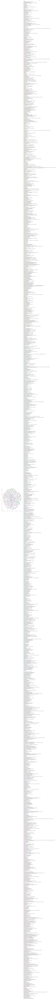

In [45]:
vis_df = pd.DataFrame({'X': X_embedded[:, 0], 'Y': X_embedded[:, 1], 'topic' : data_responses_mini.title})
sns.FacetGrid(vis_df[:2000], hue="topic", size=10).map(plt.scatter, "X", "Y").add_legend()

In [46]:
from pymystem3 import Mystem
m = Mystem()

In [47]:
mystopwords = stopwords.words('russian') 
ru_words = re.compile("[А-Яа-я]+")


def words_only(text):
    return " ".join(ru_words.findall(text))


def lemmatize(text, mystem=m):
    try:
        return "".join(m.lemmatize(text)).strip()  
    except:
        return " "


def remove_stopwords(text, mystopwords = mystopwords):
    try:
        return " ".join([token for token in text.split() if not token in mystopwords])
    except:
        return ""

def preprocess(text):
    return remove_stopwords(lemmatize(words_only(text.lower())))

In [48]:
data_responses_mini_2 = data_responses_mini

In [49]:
data_responses_mini_2.text.iloc[1]

'Доброго дня! Являюсь держателем зарплатной карты , выданной Сбербанком России. В 2008 году сменила фамилию, предоставила в банк \xa0документы (копию нового паспорта, свидетельства о браке), мне перевыпустили карту на фамилию мужа ТОКАРЕВА МАРИЯ АЛЕКСАНДРОВНА (девичья \xa0- СЕКЛЕТИНА). \xa0 Возникла необходимость подключить услугу Сбербанк онлайн, НЕ ПОЛУЧИЛОСЬ (на главной странице на отображались мои карты). Связалась с техническим специалистом отделения Сбербанка в котором обслуживалась. Он пояснил, что в базе банка, я все ещё под девичьей фамилией СЕКЛЕТИНА. Предложил выслать сканы необходимых документов. Выслала, оставив контакты, звонка так и не дождалась. Ч/з некоторое время звоню сама, объясняю ситуацию, меня пробивают по базе - опять числюсь СЕКЛЕТИНОЙ (хотя карту уже перевыпустили еще раз на фамилию ТОКАРЕВА в связи с истечением срока обслуживания). Высылаю документы (копию паспорта и свидетельства о браке). Результат \xa0- 0 (ноль). ПРошу помочь разобраться в этой ситуации. С

In [50]:
%%time
data_responses_mini_2.text = data_responses_mini_2.text.apply(preprocess)

Wall time: 2h 3min 10s


C:\Users\first\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [51]:
data_responses_mini_2.tail()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
7495,г. Новороссийск,False,Неизвестно куда и почему списаны средства с карты,6,лицензия № 1481,happynatali,Сбербанк России,2015-04-02 11:51:00,возникать следующий проблема карта списывать с...,NaN
7496,г. Тула,False,Кредитная карта и мобильный банк! ОСТОРОЖНО! М...,14,лицензия № 1481,skealtazzz,Сбербанк России,2015-04-02 11:51:00,добрый день обращение сбербанк зарегистрироват...,NaN
7497,г. Подольск,False,Один из лучших банков,5,лицензия № 1978,САМ15,Московский Кредитный Банк,2015-04-02 11:51:00,услуга банк пользоваться год претензия деньги ...,NaN
7498,г. Москва,False,Очень чёткая работа по решению вопроса и прият...,0,лицензия № 1326,9435073,Альфа-Банк,2015-04-02 12:03:15,большой спасибо профессионализм решение нестан...,5.0
7499,г. Москва,False,Беспредел службы безопасности,5,лицензия № 1481,olgatohtueva,Сбербанк России,2015-04-02 12:14:00,добрый день хотеться немного рассказывать бесп...,NaN


In [58]:
# загрузка предобработанного датасета из компьютера
# df = pd.read_csv('data_responses_mini_2.csv', encoding='utf8')
# df.head()

In [63]:
%%time
data_responses_mini_2.title = data_responses_mini_2.title.apply(preprocess)

Wall time: 2h 2min 2s


C:\Users\first\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [70]:
# сохраним предобработный датасет с подвыборкой, для случая вылета, аварийно ошибки, чтобы миновать шаги обработки текстов
data_responses_mini_2.to_csv('data_responses_mini_2_with_title.csv', encoding='utf8')

In [68]:
data_responses_mini_2.bank_name = data_responses_mini_2.bank_name.str.lower()

C:\Users\first\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [138]:
data_responses_mini_2.head()

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
0,г. Москва,False,жалоба,0,лицензия № 2562,uhnov1,бинбанк,2015-06-08 12:50:54,добрый день являться клиент банк поручитель кр...,NaN
1,г. Новосибирск,False,мочь пользоваться услуга сбербанк лайн,0,лицензия № 1481,Foryou,сбербанк россии,2015-06-08 11:09:57,добрый день являться держатель зарплатной карт...,NaN
2,г. Москва,False,двойной списание товар,1,лицензия № 2562,Vladimir84,бинбанк,2015-06-05 20:14:28,здравствовать дублировать свой заявление можай...,NaN
3,г. Ставрополь,False,менять процент комиссия предупреждать извещать...,2,лицензия № 1481,643609,сбербанк россии,2015-06-05 13:51:01,добрый день открывать расчетный счет сбербанк ...,NaN
4,г. Челябинск,False,вернуть денежный средство страховка,1,лицензия № 2766,anfisa-2003,отп банк,2015-06-05 10:58:12,г взять кредит ваш банк заявлять сумма т рубль...,NaN


#### Темы, в которых упомянуты банки

In [139]:
examples_of_bank_into_title = 0
for num_row in tqdm(range(len(data_responses_mini_2))):
    words_from_title = data_responses_mini_2.title[num_row].split()
    words_from_bank = data_responses_mini_2.bank_name[num_row].split()        
    for i in words_from_bank: 
            if (i in words_from_title) & (i != 'банк') & (i != 'кредит'):
                examples_of_bank_into_title += 1
                print(i, 10 * ' ', 'Номер отзыва в датасете:', num_row)
                print('Тема:')
                print(data_responses_mini_2.title[num_row])
                print('_________________________\n' )
            if examples_of_bank_into_title == 5:
                break

  0%|                                                                               | 5/7500 [00:00<00:01, 4994.41it/s]

сбербанк            Номер отзыва в датасете: 1
Тема:
мочь пользоваться услуга сбербанк лайн
_________________________



AttributeError: 'float' object has no attribute 'split'

In [143]:
data_responses_mini_2.title[1].split()

['мочь', 'пользоваться', 'услуга', 'сбербанк', 'лайн']


### Часть 3. Классификация текстов
Сформулируем для простоты задачу бинарной классификации: будем классифицировать на два класса, то есть, различать резко отрицательные отзывы (с оценкой 1) и положительные отзывы (с оценкой 5).

1. Составьте обучающее и тестовое множество: выберите из всего набора данных N1 отзывов с оценкой 1 и N2 отзывов с оценкой 5 (значение N1 и N2 – на ваше усмотрение). Используйте sklearn.model_selection.train_test_split для разделения множества отобранных документов на обучающее и тестовое.
2. Используйте любой известный вам алгоритм классификации текстов для решения задачи и получите baseline. Сравните разные варианты векторизации текста: использование только униграм, пар или троек слов или с использованием символьных $n$-грам.
3. Сравните, как изменяется качество решения задачи при использовании скрытых тем в качестве признаков:
- 1-ый вариант: $tf-idf$ преобразование (sklearn.feature_extraction.text.TfidfTransformer) и сингулярное разложение (оно же – латентый семантический анализ) (sklearn.decomposition.TruncatedSVD),
- 2-ой вариант: тематические модели LDA (sklearn.decomposition.LatentDirichletAllocation).
Используйте accuracy и F-measure для оценки качества классификации.

В ноутбуке, размещенном в папке репозитория. написан примерный Pipeline для классификации текстов.

Эта часть задания может быть сделана с использованием sklearn.

In [123]:
data_responses_mini_2 = pd.read_csv('data_responses_mini_2_with_title.csv', encoding='utf8')
data_responses_mini_2.head()

,Unnamed: 0,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade
0,0,г. Москва,False,жалоба,0,лицензия № 2562,uhnov1,бинбанк,2015-06-08 12:50:54,добрый день являться клиент банк поручитель кр...,NaN
1,1,г. Новосибирск,False,мочь пользоваться услуга сбербанк лайн,0,лицензия № 1481,Foryou,сбербанк россии,2015-06-08 11:09:57,добрый день являться держатель зарплатной карт...,NaN
2,2,г. Москва,False,двойной списание товар,1,лицензия № 2562,Vladimir84,бинбанк,2015-06-05 20:14:28,здравствовать дублировать свой заявление можай...,NaN
3,3,г. Ставрополь,False,менять процент комиссия предупреждать извещать...,2,лицензия № 1481,643609,сбербанк россии,2015-06-05 13:51:01,добрый день открывать расчетный счет сбербанк ...,NaN
4,4,г. Челябинск,False,вернуть денежный средство страховка,1,лицензия № 2766,anfisa-2003,отп банк,2015-06-05 10:58:12,г взять кредит ваш банк заявлять сумма т рубль...,NaN


In [6]:
data_3 = data_responses_mini_2[(data_responses_mini_2.rating_grade == 1.) | (data_responses_mini_2.rating_grade == 5.)][['text','rating_grade']]

In [9]:
data_3.rating_grade[data_3.rating_grade == 1.] = 0
data_3.rating_grade[data_3.rating_grade == 5.] = 1
data_3.tail()

<ipython-input-9-1de76a5f63c7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_3.rating_grade[data_3.rating_grade == 5.] = 1


,text,rating_grade
7477,основной человек оставлять отзыв довольный мом...,1.0
7482,просить банк предоставлять разъяснение факт на...,0.0
7484,иметь ипотечный кредит сбербанк оформлять г то...,0.0
7489,добрый день брать потребительский кредит банк ...,0.0
7498,большой спасибо профессионализм решение нестан...,1.0


In [13]:
X_train, X_test, y_train, y_test = train_test_split(data_3['text'], data_3['rating_grade'], 
                                                    test_size=0.33, random_state=42)

## Классификация текстов

In [97]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

clf_2_0 = Pipeline([
    ('vect', CountVectorizer(analyzer = 'char', ngram_range={4,6})),
    ('clf', RandomForestClassifier()),
])

clf_2_1 = Pipeline([ 
    ('vect', CountVectorizer(analyzer = 'word', ngram_range=(1,1))), 
    ('clf', RandomForestClassifier())
])

clf_2_2 = Pipeline([ 
    ('vect', CountVectorizer(analyzer = 'word', ngram_range=(1,2))), 
    ('clf', RandomForestClassifier())
])

clf_2_3 = Pipeline([ 
    ('vect', CountVectorizer(analyzer = 'char', ngram_range={2,4})), 
    ('clf', RandomForestClassifier())
])

clf_2_4 = Pipeline([ 
    ('vect', CountVectorizer(analyzer = 'word', ngram_range=(2,2))), 
    ('clf', RandomForestClassifier())
])

clf_2_5 = Pipeline([
    ('vect', CountVectorizer(analyzer = 'char')),
    ('clf', RandomForestClassifier()),
])

clf_2_6 = Pipeline([ 
    ('vect', CountVectorizer(analyzer = 'word', ngram_range=(1,2))), 
    ('tfidf', TfidfTransformer()),
    ('tm', TruncatedSVD()), 
    ('clf', RandomForestClassifier())
])

In [98]:
clf_2_0.fit(X_train, y_train)
pred = clf_2_0.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95       684
         1.0       0.41      0.98      0.57        46

    accuracy                           0.91       730
   macro avg       0.70      0.94      0.76       730
weighted avg       0.96      0.91      0.92       730



In [99]:
clf_2_1.fit(X_train, y_train)
pred = clf_2_0.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95       684
         1.0       0.41      0.98      0.57        46

    accuracy                           0.91       730
   macro avg       0.70      0.94      0.76       730
weighted avg       0.96      0.91      0.92       730



In [100]:
clf_2_2.fit(X_train, y_train)
pred = clf_2_0.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95       684
         1.0       0.41      0.98      0.57        46

    accuracy                           0.91       730
   macro avg       0.70      0.94      0.76       730
weighted avg       0.96      0.91      0.92       730



In [101]:
clf_2_3.fit(X_train, y_train)
pred = clf_2_3.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94       694
         1.0       0.32      1.00      0.49        36

    accuracy                           0.90       730
   macro avg       0.66      0.95      0.72       730
weighted avg       0.97      0.90      0.92       730



In [102]:
clf_2_4.fit(X_train, y_train)
pred = clf_2_4.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92       725
         1.0       0.05      1.00      0.09         5

    accuracy                           0.85       730
   macro avg       0.52      0.93      0.50       730
weighted avg       0.99      0.85      0.92       730



In [103]:
clf_2_5.fit(X_train, y_train)
pred = clf_2_5.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92       725
         1.0       0.04      0.80      0.07         5

    accuracy                           0.85       730
   macro avg       0.52      0.83      0.49       730
weighted avg       0.99      0.85      0.91       730



In [104]:
clf_2_6.fit(X_train, y_train)
pred = clf_2_6.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

         0.0       0.97      0.85      0.91       706
         1.0       0.06      0.29      0.10        24

    accuracy                           0.83       730
   macro avg       0.52      0.57      0.51       730
weighted avg       0.94      0.83      0.88       730



#### Видно, что модели от 2_0 до 2_2 получается точность лучше (0,90), чем в остальных. Это анализатор word - с уни- и биграммами и анализатор char - с символами от 4 до 6.

In [14]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import LdaModel
from sklearn.decomposition import TruncatedSVD
from sklearn.ensemble import RandomForestClassifier

### 1-ый вариант: tf-idf + LSI

In [15]:
data_3_3 = data_3

In [16]:
data_3_3.head()

,text,rating_grade
19,открывать вклад счет плюс это зарплатный карта...,0.0
33,добрый время вчера поступать смс уведомление б...,0.0
76,г около час приходить указанный офис намерение...,0.0
85,оплата коммунальный платеж пользоваться пласти...,0.0
94,апрель год приходить отделение сбербанк г чапа...,0.0


In [19]:
texts_3 = [text.split() for text in data_3_3.text]
dictionary_3 = Dictionary(texts_3)
corpus_3 = [dictionary_3.doc2bow(text) for text in texts_3]

In [21]:
tfidf_3 = TfidfModel(corpus_3)
corpus_tfidf_3 = tfidf_3[corpus_3]

In [23]:
lsi_3 = lsimodel.LsiModel(corpus=corpus_tfidf_3, id2word=dictionary_3, num_topics=30)
corpus_lsi_3 = lsi_3[corpus_3]

In [24]:
# data_3_3['hidden_theme'].iloc[0] = (corpus_lsi_3[1])
corpus_lsi_3[0][0][1]

-8.51222080960225

In [25]:
corpus_lsi_3[0]

[(0, -8.51222080960225),
 (1, -4.297872551000465),
 (2, -0.24880705858248559),
 (3, -1.2921973800256656),
 (4, 1.0001157265336622),
 (5, -3.10098230935102),
 (6, 3.126440242382159),
 (7, 1.0374015871352873),
 (8, 1.2028328488600586),
 (9, 1.0911284376028336),
 (10, -0.6542347564634606),
 (11, 4.324108212696194),
 (12, -0.5204458677761281),
 (13, -3.238695012453573),
 (14, -1.5179685642611351),
 (15, -0.2947182636319272),
 (16, 5.99634949487305),
 (17, 0.4236120055453185),
 (18, 0.5661226388784141),
 (19, 0.4497235142245806),
 (20, -1.8414365700266893),
 (21, -2.0150991740811715),
 (22, -0.5086064177921499),
 (23, 2.059975662713451),
 (24, 0.3759451477393031),
 (25, 0.9023351194147518),
 (26, -2.4235688614719355),
 (27, 2.2657517534438023),
 (28, -0.5064954212720738),
 (29, 1.5995047725233702)]

In [26]:
num_topics = 30
for num in range(num_topics):
    data_3_3['hidden_theme' + '_' + f'{num}'] = 0

In [27]:
data_3_3.head()

,text,rating_grade,hidden_theme_0,hidden_theme_1,hidden_theme_2,hidden_theme_3,hidden_theme_4,hidden_theme_5,hidden_theme_6,hidden_theme_7,...,hidden_theme_20,hidden_theme_21,hidden_theme_22,hidden_theme_23,hidden_theme_24,hidden_theme_25,hidden_theme_26,hidden_theme_27,hidden_theme_28,hidden_theme_29
19,открывать вклад счет плюс это зарплатный карта...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,добрый время вчера поступать смс уведомление б...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,г около час приходить указанный офис намерение...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
85,оплата коммунальный платеж пользоваться пласти...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,апрель год приходить отделение сбербанк г чапа...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
for row in range(len(data_3_3)):
    for thema in range(num_topics):
        data_3_3['hidden_theme_' + f'{thema}'].iloc[row] = corpus_lsi_3[row][thema][1]

C:\Users\first\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [29]:
data_3_3.head()

,text,rating_grade,hidden_theme_0,hidden_theme_1,hidden_theme_2,hidden_theme_3,hidden_theme_4,hidden_theme_5,hidden_theme_6,hidden_theme_7,...,hidden_theme_20,hidden_theme_21,hidden_theme_22,hidden_theme_23,hidden_theme_24,hidden_theme_25,hidden_theme_26,hidden_theme_27,hidden_theme_28,hidden_theme_29
19,открывать вклад счет плюс это зарплатный карта...,0.0,-8.512221,-4.297873,-0.248807,-1.292197,1.000116,-3.100982,3.126440,1.037402,...,-1.841437,-2.015099,-0.508606,2.059976,0.375945,0.902335,-2.423569,2.265752,-0.506495,1.599505
33,добрый время вчера поступать смс уведомление б...,0.0,-8.628902,8.213274,1.703925,-3.449661,2.838044,1.434651,-0.250254,0.503004,...,-0.344114,0.266141,0.097692,0.378333,-0.771237,1.181645,-0.535833,0.177366,-1.168360,-2.645484
76,г около час приходить указанный офис намерение...,0.0,-3.895218,-0.125547,3.174909,4.309108,2.558720,-0.273008,-1.426987,0.471040,...,0.193658,0.279227,0.002415,-1.457731,-0.033734,-0.606960,0.400575,-0.637465,1.132389,-0.258798
85,оплата коммунальный платеж пользоваться пласти...,0.0,-1.828635,-0.504255,-0.604325,0.565174,-0.301523,-0.860141,0.158120,0.537418,...,-0.298167,0.349933,0.210247,-0.052832,-0.347143,0.163825,-0.141651,-0.976878,0.353620,0.752467
94,апрель год приходить отделение сбербанк г чапа...,0.0,-6.072442,-1.122696,-0.822229,0.954881,0.742762,-0.521325,0.387451,-1.948218,...,-0.740494,-0.652575,-1.587322,1.033339,-1.944084,-0.870921,-0.133550,-1.595411,1.972453,0.970905


In [30]:
data_3_3X = data_3_3.iloc[:, 3:]

In [31]:
data_3_3X.head()

,hidden_theme_1,hidden_theme_2,hidden_theme_3,hidden_theme_4,hidden_theme_5,hidden_theme_6,hidden_theme_7,hidden_theme_8,hidden_theme_9,hidden_theme_10,...,hidden_theme_20,hidden_theme_21,hidden_theme_22,hidden_theme_23,hidden_theme_24,hidden_theme_25,hidden_theme_26,hidden_theme_27,hidden_theme_28,hidden_theme_29
19,-4.297873,-0.248807,-1.292197,1.000116,-3.100982,3.126440,1.037402,1.202833,1.091128,-0.654235,...,-1.841437,-2.015099,-0.508606,2.059976,0.375945,0.902335,-2.423569,2.265752,-0.506495,1.599505
33,8.213274,1.703925,-3.449661,2.838044,1.434651,-0.250254,0.503004,-1.144961,-1.064885,0.214185,...,-0.344114,0.266141,0.097692,0.378333,-0.771237,1.181645,-0.535833,0.177366,-1.168360,-2.645484
76,-0.125547,3.174909,4.309108,2.558720,-0.273008,-1.426987,0.471040,0.735573,-0.963671,0.400127,...,0.193658,0.279227,0.002415,-1.457731,-0.033734,-0.606960,0.400575,-0.637465,1.132389,-0.258798
85,-0.504255,-0.604325,0.565174,-0.301523,-0.860141,0.158120,0.537418,0.116292,0.938272,0.374345,...,-0.298167,0.349933,0.210247,-0.052832,-0.347143,0.163825,-0.141651,-0.976878,0.353620,0.752467
94,-1.122696,-0.822229,0.954881,0.742762,-0.521325,0.387451,-1.948218,-0.730258,2.142322,1.436324,...,-0.740494,-0.652575,-1.587322,1.033339,-1.944084,-0.870921,-0.133550,-1.595411,1.972453,0.970905


In [32]:
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(data_3_3X, data_3['rating_grade'], 
                                                    test_size=0.33, random_state=42)

In [33]:
# !!! На каждом этапе Pipeline нужно указать свои параметры
# 1-ый вариант: tf-idf + LSI

clf_3_1 = Pipeline([ 
    ('clf', RandomForestClassifier())
])


In [34]:
clf_3_1.fit(X_train_3, y_train_3)
pred_3 = clf_3_1.predict(X_test_3)
print(classification_report(pred_3, y_test_3))

              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95       678
         1.0       0.44      0.94      0.60        52

    accuracy                           0.91       730
   macro avg       0.72      0.93      0.78       730
weighted avg       0.96      0.91      0.93       730



###  2-ой вариант: LDA

In [35]:
data_3_3_2 = data_3

In [36]:
from gensim.test.utils import common_texts
from gensim.corpora.dictionary import Dictionary

In [237]:
# из предыдущего варианта модели tf-idf + LSI
# texts_3 = [text.split() for text in data_3_3.text]
# dictionary_3 = Dictionary(texts_3)
# corpus_3 = [dictionary_3.doc2bow(text) for text in texts_3]

In [37]:
common_dictionary = dictionary_3
common_corpus = corpus_3

In [38]:
lda = LdaModel(common_corpus, num_topics=30)

In [39]:
corpus_lda_3 = lda[corpus_3]

In [40]:
num_topics = 30
for num in range(num_topics):
    data_3_3_2['hidden_theme' + '_' + f'{num}'] = 0

In [41]:
data_3_3_2.head()

,text,rating_grade,hidden_theme_0,hidden_theme_1,hidden_theme_2,hidden_theme_3,hidden_theme_4,hidden_theme_5,hidden_theme_6,hidden_theme_7,...,hidden_theme_20,hidden_theme_21,hidden_theme_22,hidden_theme_23,hidden_theme_24,hidden_theme_25,hidden_theme_26,hidden_theme_27,hidden_theme_28,hidden_theme_29
19,открывать вклад счет плюс это зарплатный карта...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,добрый время вчера поступать смс уведомление б...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,г около час приходить указанный офис намерение...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
85,оплата коммунальный платеж пользоваться пласти...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,апрель год приходить отделение сбербанк г чапа...,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [105]:
data_3_3_2X = data_3_3_2.iloc[:, 3:]

In [116]:
for row in range(len(data_3_3_2X)):
    for column in range(len(data_3_3_2X.columns)):
        dict_themes = dict(corpus_lda_3[row])
        if column in dict_themes.keys():
            data_3_3_2X.iloc[row, column] = dict_themes[column]

In [119]:
data_3_3_2X.tail()

,hidden_theme_1,hidden_theme_2,hidden_theme_3,hidden_theme_4,hidden_theme_5,hidden_theme_6,hidden_theme_7,hidden_theme_8,hidden_theme_9,hidden_theme_10,...,hidden_theme_20,hidden_theme_21,hidden_theme_22,hidden_theme_23,hidden_theme_24,hidden_theme_25,hidden_theme_26,hidden_theme_27,hidden_theme_28,hidden_theme_29
7477,0.0,0.000000,0.142963,0.000000,0.074447,0.124983,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.646197,0.0,0.0,0.0,0.000000
7482,0.0,0.000000,0.371863,0.000000,0.000000,0.000000,0.0,0.113693,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7484,0.0,0.090824,0.330991,0.533444,0.000000,0.000000,0.0,0.039903,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7489,0.0,0.000000,0.000000,0.843755,0.000000,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7498,0.0,0.000000,0.544330,0.000000,0.378346,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.059025


In [120]:
X_train_3_2, X_test_3_2, y_train_3_2, y_test_3_2 = train_test_split(data_3_3_2X, data_3['rating_grade'], 
                                                    test_size=0.33, random_state=42)

In [121]:
clf_3_2 = Pipeline([ 
    ('clf', RandomForestClassifier())
])

In [122]:
clf_3_2.fit(X_train_3_2, y_train_3_2)
pred_3_2 = clf_3_2.predict(X_test_3_2)
print(classification_report(pred_3_2, y_test_3_2))

              precision    recall  f1-score   support

         0.0       0.98      0.88      0.93       691
         1.0       0.24      0.69      0.36        39

    accuracy                           0.87       730
   macro avg       0.61      0.79      0.64       730
weighted avg       0.94      0.87      0.90       730



#### Видно, что 1-й вариант даёт лучшее качество tf-idf + LSI (0.91), по сравнению с LDA (0,87). Видимо из-за того, что LDA выдаёт меньшее количество данных с вероятностями по темам.